LAGRANGIAN MECHANICS IN ACTION

SPIRNG MASS SYSTEM

In [121]:
from sympy import *
from sympy import cos
from sympy.physics.mechanics import *
init_vprinting()

In [122]:
# define symbols
m, g, k, t,b = symbols('m g k t b')
x = dynamicsymbols('x')

# take derivatives
x_dot = diff(x, t)
x_ddot = diff(x_dot, t)

# Lagrangian
T = 1/2*m*x_dot**2
V = -m*g*x + 1/2*k*x**2
L = T - V
F=0.5*b*x_dot**2 # dissipative function

# solve Euler-Lagrange
eqn = diff( diff(L, x_dot), t) - diff(L, x)+diff(F,x_dot)
sln = solve(eqn,x_ddot)[0]
Eq(x_ddot, sln)

SPRING MASS SYSTEM SUSPENDED VERTICALLY 

In [123]:
import numpy as np
from scipy.integrate import solve_ivp

import matplotlib.pyplot as plt
import matplotlib.animation as animation

In [124]:
g=9.81
k=40
m=1
b=1
x0=0
x_dot0=0
def spring_mass_friction_ODE(t,y):
    return(y[1],g-k*y[0]/(2*m)-b*y[1]/m)
sol=solve_ivp(spring_mass_friction_ODE,[0,10],(x0,x_dot0),t_eval=np.linspace(0,10,10*30))
x,x_dot=sol.y
t=sol.t

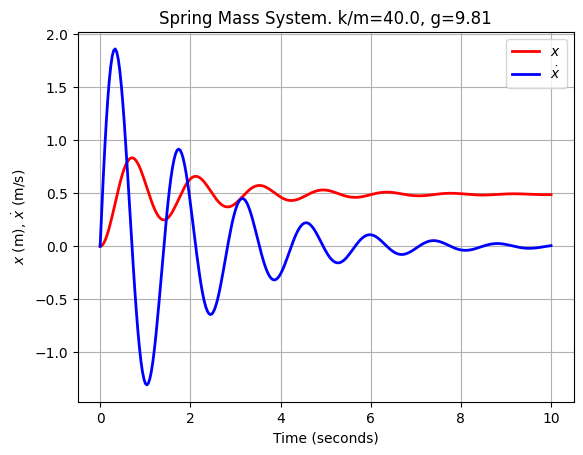

In [125]:
plt.plot(t, x, 'r', lw=2, label=r'$x$')
plt.plot(t, x_dot, 'b', lw=2, label=r'$\dot x$')
plt.title(f'Spring Mass System. k/m={k/m}, g={g}')
plt.legend()
plt.xlabel('Time (seconds)')
plt.ylabel(r'$x$ (m), $\dot x$ (m/s)')
plt.grid()
plt.show()

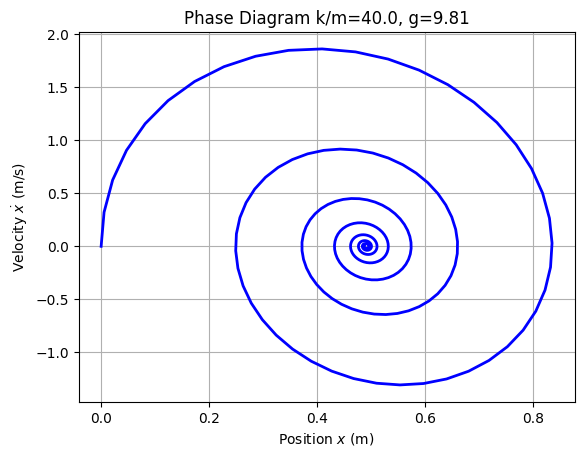

In [126]:
plt.plot(x, x_dot, 'b', lw=2)
plt.title(f'Phase Diagram k/m={k/m}, g={g}')
plt.xlabel(r'Position $x$ (m)')
plt.ylabel(r'Velocity $\dot x$ (m/s)')
plt.grid()
plt.show()

In [35]:
user_time=int(input("enter the time"))
index = np.abs(t - user_time).argmin()
print(f"At time {t[index]:.2f}, Position: {x[index]:.2f}, Velocity: {x_dot[index]:.2f}")

At time 4.98, Position: 0.53, Velocity: -0.03


PENDULUM(YES , ONLY ONE NOT COUPLED , LETS START EASY)

In [127]:
# define symbols
m, g, l, t,k= symbols('m g l t k ')
an,x = dynamicsymbols('theta x')

# take derivatives
x_dot = diff(x, t)
x_ddot = diff(x_dot, t)
an_dot=diff(an,t)
an_ddot=diff(an_dot,t)
# Lagrangian
T = 1/2*m*(x_dot**2+((l+x)*an_dot)**2)
V = -m*g*(l+x)*cos(an)+0.5*k*x**2
L = T - V
# solve Euler-Lagrange
eqn = diff( diff(L, x_dot), t) - diff(L, x)
sln = solve(eqn,x_ddot)[0]
Eq(x_ddot, sln)

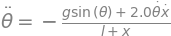

In [128]:
eqn=diff(diff(L,an_dot),t)-diff(L,an)
sln=solve(eqn,an_ddot)[0]
Eq(an_ddot,sln)

In [129]:
g=9.81
m=1
l=1
x0=0
k=1
x_dot0=5
an
def spring_mass_friction_ODE(t,y):
    return(y[1],-g*sin(y[0])/(l))
sol=solve_ivp(spring_mass_friction_ODE,[0,10],(x0,x_dot0),t_eval=np.linspace(0,10,10*30))
x,x_dot=sol.y
t=sol.t

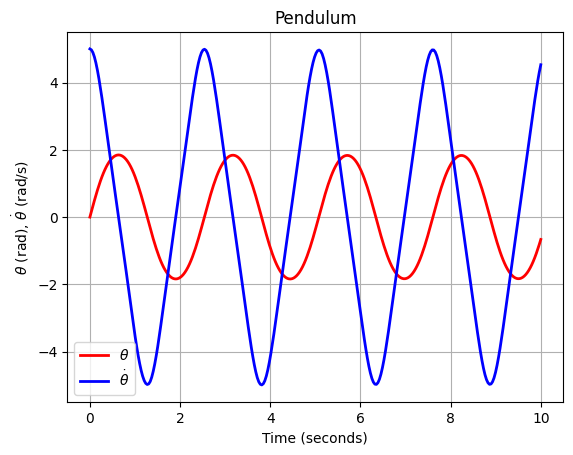

In [130]:
plt.plot(t, x, 'r', lw=2, label=r'$\theta$')
plt.plot(t, x_dot, 'b', lw=2, label=r'$\dot \theta$')
plt.title(f'Pendulum')
plt.legend()
plt.xlabel('Time (seconds)')
plt.ylabel(r'$\theta$ (rad), $\dot \theta$ (rad/s)')
plt.grid()
plt.show()

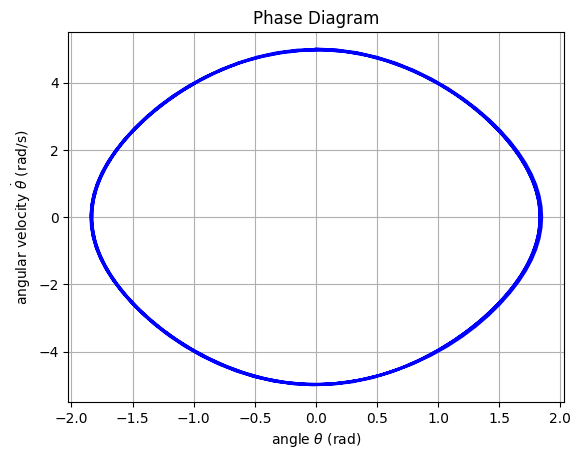

In [131]:
plt.plot(x, x_dot, 'b', lw=2)
plt.title(f'Phase Diagram')
plt.xlabel(r'angle $\theta$ (rad)')
plt.ylabel(r'angular velocity $\dot \theta$ (rad/s)')
plt.grid()
plt.show()

In [41]:
user_time=int(input("enter the time"))
index = np.abs(t - user_time).argmin()
print(f"At time {t[index]:.2f}, angle: {x[index]:.2f}, angular velocity: {x_dot[index]:.2f}")

At time 4.98, angle: -0.45, angular velocity: 4.76


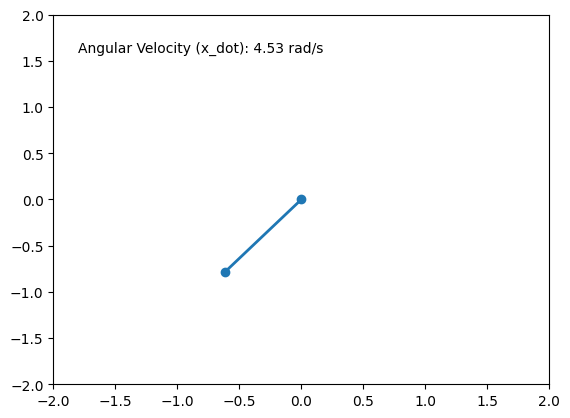

In [133]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Constants
l = 1.0   # Length of the pendulum (m)

# Create a function to calculate x and y positions from x and l
def calculate_positions(x, l):
    x_positions = l * np.sin(x)
    y_positions = -l * np.cos(x)
    return x_positions, y_positions

# Create a function to update the pendulum's position and velocity in the animation
def update_pendulum(frame, x_data, x_dot_data, l):
    x_positions, y_positions = calculate_positions(x_data[frame], l)
    pendulum.set_data([0, x_positions], [0, y_positions])
    velocity_text.set_text(f'Angular Velocity (x_dot): {x_dot_data[frame]:.2f} rad/s')
    return pendulum, velocity_text

# Create a figure and axis for the animation
plt.figure()
plt.xlim(-2, 2)
plt.ylim(-2, 2)  # Adjust the y-limit for better visualization
pendulum, = plt.plot([], [], 'o-', lw=2)
velocity_text = plt.text(0.05, 0.9, '', transform=plt.gca().transAxes)

# Create the animation
ani = FuncAnimation(plt.gcf(), update_pendulum, frames=len(x), fargs=(x, x_dot, l), blit=True)

# Display the animation
HTML(ani.to_jshtml())


SPRING PENDULUM

In [134]:
# define symbols
m, g, l, t,k= symbols('m g l t k ')
an,x = dynamicsymbols('theta x')

# take derivatives
x_dot = diff(x, t)
x_ddot = diff(x_dot, t)
an_dot=diff(an,t)
an_ddot=diff(an_dot,t)
# Lagrangian
T = 1/2*m*(x_dot**2+((l+x)*an_dot)**2)
V = -m*g*(l+x)*cos(an)+0.5*k*x**2
L = T - V
# solve Euler-Lagrange
eqn = diff( diff(L, x_dot), t) - diff(L, x)
sln = solve(eqn,x_ddot)[0]
Eq(x_ddot, sln)

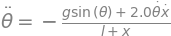

In [135]:
eqn=diff(diff(L,an_dot),t)-diff(L,an)
sln=solve(eqn,an_ddot)[0]
Eq(an_ddot,sln)

In [102]:
g=9.81
m=1
l=1
k=5
initial_condition=[1,0,3.14/10,0]
def spring_mass_friction_ODE(t,y):# y=[0,1,2,3] 0= x,1=xdot,2=theta,3=theta_dot
    return(y[1],g*cos(y[2])-k*y[0]/m+(l+y[0])*(y[3]**2),y[3],-((g*sin(y[2])+2*y[3]*y[1])/(l+y[0])))
sol=solve_ivp(spring_mass_friction_ODE,[0,10],initial_condition,t_eval=np.linspace(0,10,10*30))
theta_result=sol.y[2] # contains array of theta at various moment in time
thetadot_result=sol.y[3]
x_result=sol.y[0] # contains position at various moment in time 
xdot_result=sol.y[1]
t=sol.t

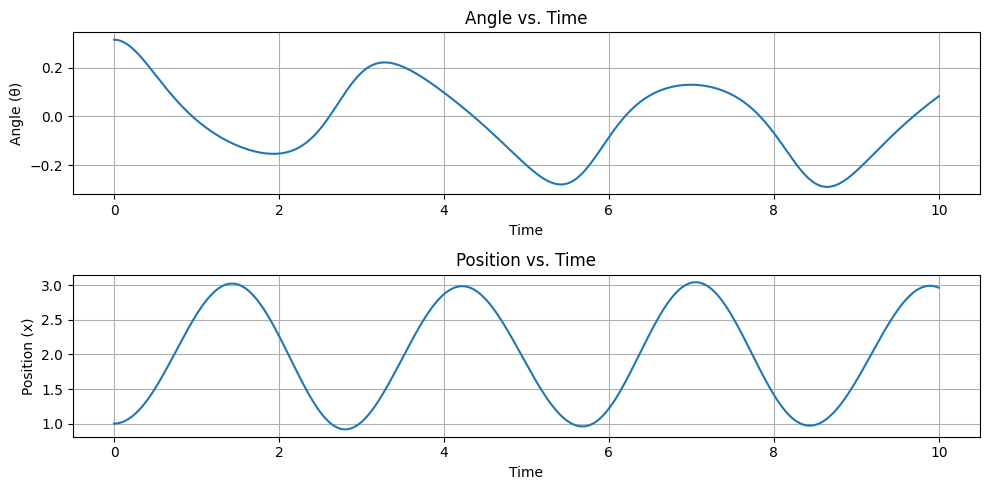

In [103]:
plt.figure(figsize=(10, 5))
plt.subplot(2, 1, 1)
plt.plot(t, theta_result, label='θ (Angle)')
plt.title('Angle vs. Time')
plt.xlabel('Time')
plt.ylabel('Angle (θ)')
plt.grid()

# Plot x vs. time
plt.subplot(2, 1, 2)
plt.plot(t, x_result, label='x (Position)')
plt.title('Position vs. Time')
plt.xlabel('Time')
plt.ylabel('Position (x)')
plt.grid()

plt.tight_layout()
plt.show()

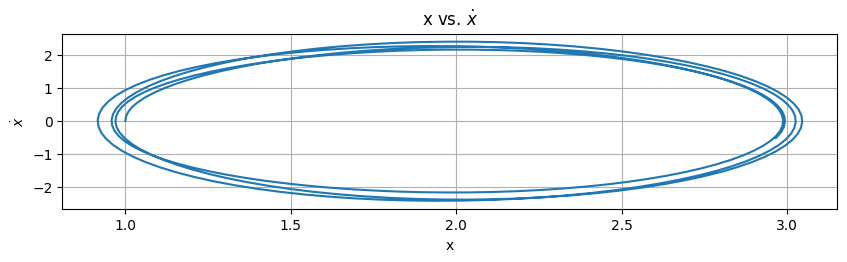

In [104]:
plt.figure(figsize=(10, 5))
plt.subplot(2, 1, 1)
plt.plot(x_result, xdot_result, label='θ (Angle)')
plt.title('x vs. $\dot x$')
plt.xlabel('x')
plt.ylabel('$\dot x$')
plt.grid()


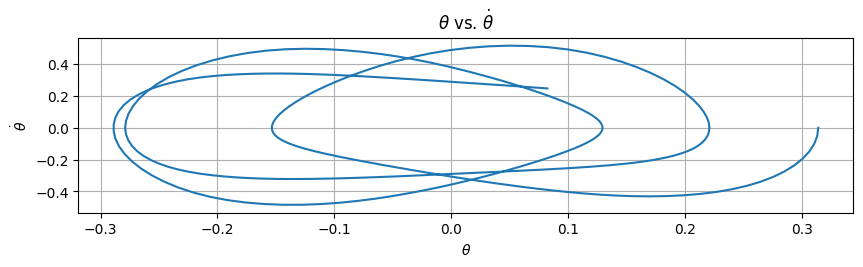

In [105]:
plt.figure(figsize=(10, 5))
plt.subplot(2, 1, 1)
plt.plot(theta_result, thetadot_result, label='θ (Angle)')
plt.title(r'$\theta$ vs. $\dot \theta$')
plt.xlabel(r'$\theta$')
plt.ylabel(r'$\dot \theta$')
plt.grid()

In [106]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.integrate import solve_ivp
from scipy.constants import g
from math import sin, cos
from IPython.display import HTML  # Import HTML to display the animation in Jupyter


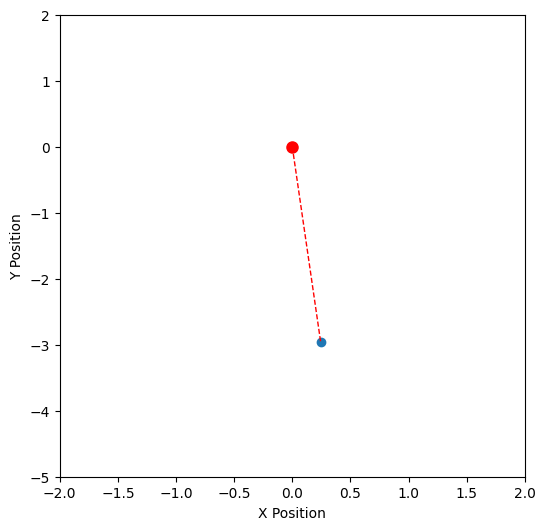

In [107]:
# Create an animation
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-2, 2)
ax.set_ylim(-5, 2)
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
line, = ax.plot([], [], 'o-', lw=2)
fixed_point, = ax.plot(0, 0, 'ro', markersize=8)  # Add a red fixed point at the origin
line_to_fixed_point, = ax.plot([], [], 'r--', lw=1)  # Add a dashed line connecting the fixed point to the object

def animate(i):
    x = x_result[i] * sin(theta_result[i])
    y = -x_result[i] * cos(theta_result[i])
    line.set_data(x, y)
    line_to_fixed_point.set_data([0, x], [0, y])  # Update the line to connect the fixed point and the object
    return line, fixed_point, line_to_fixed_point

ani = FuncAnimation(fig, animate, frames=len(t), repeat=False, blit=True)

# Display the animation in Jupyter Notebook or Lab
HTML(ani.to_jshtml())

TWO OBJECT COUPLED BY SPRING 

In [10]:
# define symbols
m,t,k= symbols('m t k ')
x,y = dynamicsymbols('x y')

# take derivatives
x_dot = diff(x, t)
x_ddot = diff(x_dot, t)
y_dot=diff(y,t)
y_ddot=diff(y_dot,t)
# Lagrangian
T = 1/2*m*(x_dot**2+y_dot**2)
V = 0.5*k*x**2+0.5*k*(x-y)**2+0.5*k*y**2
L = T - V
# solve Euler-Lagrange
eqn = diff( diff(L, x_dot), t) - diff(L, x)
sln = solve(eqn,x_ddot)[0]
Eq(x_ddot, sln)

In [11]:
#solving  Euler-Lagrange 
eqn=diff(diff(L,y_dot),t)-diff(L,y)
sln=solve(eqn,y_ddot)[0]
Eq(y_ddot,sln)

In [28]:
m=1
k=5
initial_condition=[1,0,1,0]
def spring_mass_friction_ODE(t,z):# z=[0,1,2,3] 0= x,1=xdot,2=y,3=y_dot
    return(z[1],k*(-2*z[0]+z[2])/m,z[3],k*(z[0]-2*z[2])/m)
sol=solve_ivp(spring_mass_friction_ODE,[0,10],initial_condition,t_eval=np.linspace(0,10,10*30))
y_result=sol.y[2] # contains array of y at various moment in time
ydot_result=sol.y[3] # contains array of ydot at various moment in time 
x_result=sol.y[0] # contains x at various moment in time 
xdot_result=sol.y[1] # contains xdot at various moment in time
t=sol.t

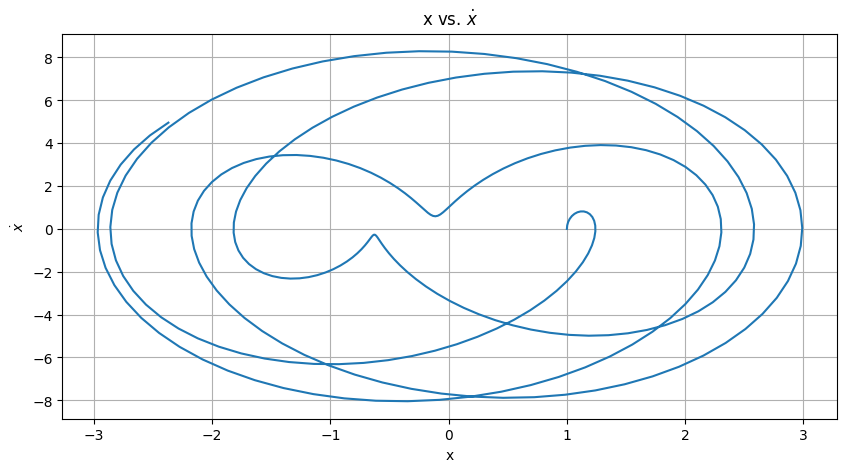

In [13]:
plt.figure(figsize=(10, 5))
#plt.subplot(2, 1,1)
plt.plot(x_result, xdot_result, label='x')
plt.title('x vs. $\dot x$')
plt.xlabel('x')
plt.ylabel('$\dot x$')
plt.grid()


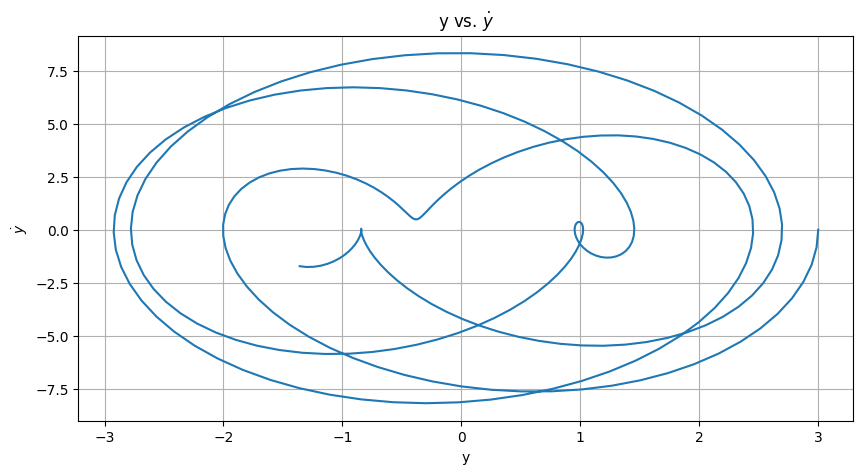

In [14]:
plt.figure(figsize=(10, 5))
#plt.subplot(2, 1, 1)
plt.plot(y_result, ydot_result, label='x')
plt.title('y vs. $\dot y$')
plt.xlabel('y')
plt.ylabel('$\dot y$')
plt.grid()


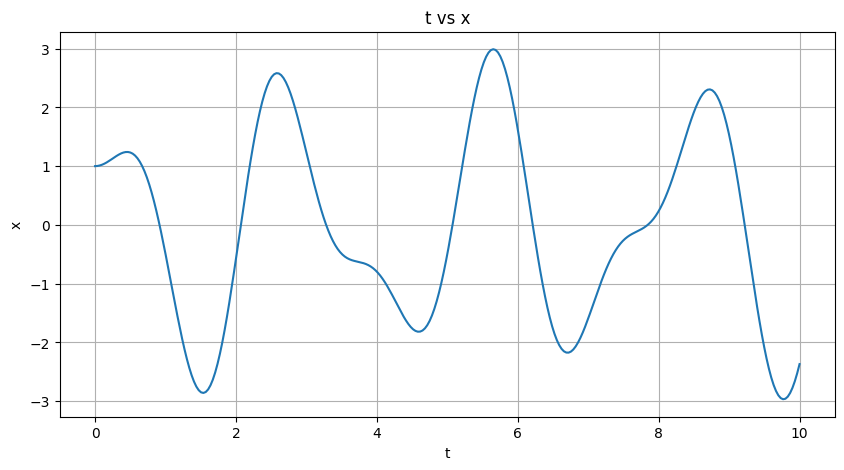

In [15]:
plt.figure(figsize=(10, 5))
#plt.subplot(2, 1, 1)
plt.plot(t,x_result,label='t x ')
plt.title('t vs x')
plt.xlabel('t')
plt.ylabel('x')
plt.grid()


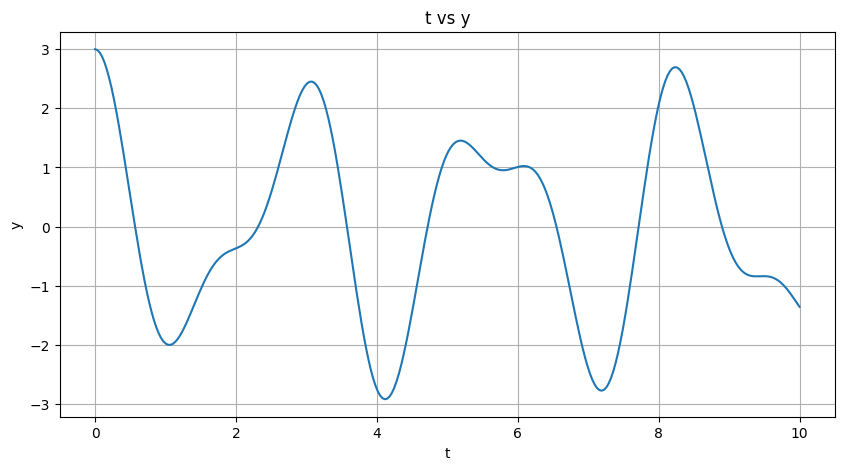

In [16]:
plt.figure(figsize=(10, 5))
#plt.subplot(2, 1, 1)
plt.plot(t,y_result,label='t x ')
plt.title('t vs y')
plt.xlabel('t')
plt.ylabel('y')
plt.grid()


In [30]:
y_result=3+y_result

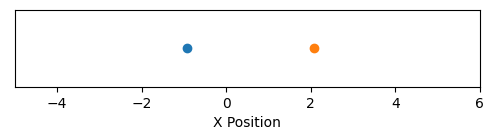

In [32]:
# Create an animation function
fig, ax = plt.subplots(figsize=(6, 1))
ax.set_xlim(-5, 6)  # Adjust the x-axis limits
ax.set_ylim(-1, 1)  # Set the y-axis limits to a small range
ax.set_xlabel('X Position')
ax.set_yticks([])  # Remove y-axis ticks and labels

particle1, = ax.plot([], [], 'o-', lw=2, label='Particle 1')  # Particle 1
particle2, = ax.plot([], [], 'o-', lw=2, label='Particle 2')  # Particle 2

def animate(i):
    particle1.set_data(x_result[i], 0)  # Update the x-position of Particle 1 (y-position remains 0)
    particle2.set_data(y_result[i], 0)  # Update the x-position of Particle 2 (y-position remains 0)
    
    return particle1, particle2

ani = FuncAnimation(fig, animate, frames=len(sol.t), repeat=False, blit=True)

# Display the animation in Jupyter Notebook or Lab
HTML(ani.to_jshtml())

USING RUNGE KUTTA METHOD 

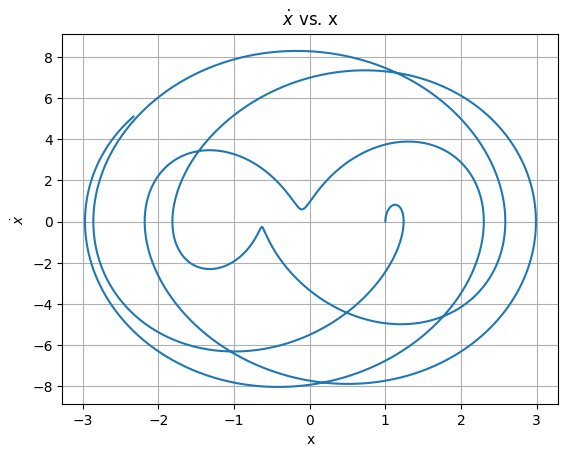

In [117]:
import numpy as np
import matplotlib.pyplot as plt

# Define the system of first-order differential equations
def system_of_equations(t, variables):
    u, x, y, s = variables
    
    dxdt = u
    dudt = k * (-2 * x + y) / m
    dydt = s
    dsdt = k * (x - 2 * y) / m
    return [dudt, dxdt, dydt, dsdt]  # Corrected order of return values

# Define the Runge-Kutta (RK4) method
def runge_kutta_4th_order(h, t, variables):
    k1 = np.multiply(h, system_of_equations(t, variables))
    k2 = np.multiply(h, system_of_equations(t + h/2, np.add(variables, k1/2)))
    k3 = np.multiply(h, system_of_equations(t + h/2, np.add(variables, k2/2)))
    k4 = np.multiply(h, system_of_equations(t + h, np.add(variables, k3)))

    return np.add(variables, (k1 + 2*k2 + 2*k3 + k4)/6)

# Set initial conditions and parameters
t0 = 0.0  # Initial time
t_max = 10.0  # Maximum time
h = 0.01  # Step size
u0 = 0.0  # Initial value of u
x0 = 1.0  # Initial value of x
y0 = 3.0  # Initial value of y
s0 = 0.0  # Initial value of s

# Initialize arrays to store results
t_values = [t0]
variables = [u0, x0, y0, s0]

# Parameters for the system
m = 1.0  # Mass
k = 5.0  # Spring constant

# Perform the numerical integration using RK4
t = t0
u_values = [u0]
x_values = [x0]
y_values=[y0]
s_values=[s0]
time=[t0]
while t < t_max:
    variables = runge_kutta_4th_order(h, t, variables)
    t += h
    t_values.append(t)
    u_values.append(variables[0])
    x_values.append(variables[1])
    y_values.append(variables[2])
    s_values.append(variables[3])
    time.append(t)

# Now, you can plot u against x.
plt.plot(x_values, u_values)
plt.xlabel('x')
plt.ylabel('$\dot x$')
plt.title('$\dot x$ vs. x')
plt.grid(True)
plt.show()


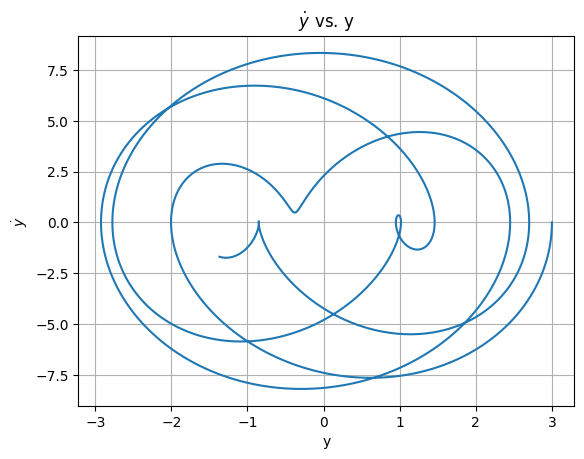

In [96]:
plt.plot(y_values, s_values)
plt.xlabel('y')
plt.ylabel('$\dot y$')
plt.title('$\dot y$ vs. y')
plt.grid(True)
plt.show()


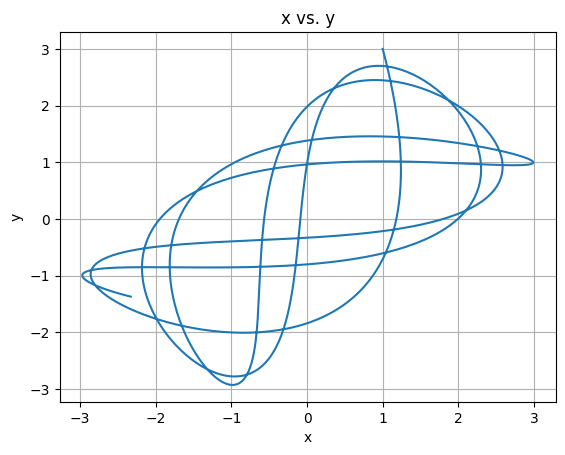

In [97]:
plt.plot(x_values, y_values)
plt.xlabel('x')
plt.ylabel('y')
plt.title('x vs. y')
plt.grid(True)
plt.show()


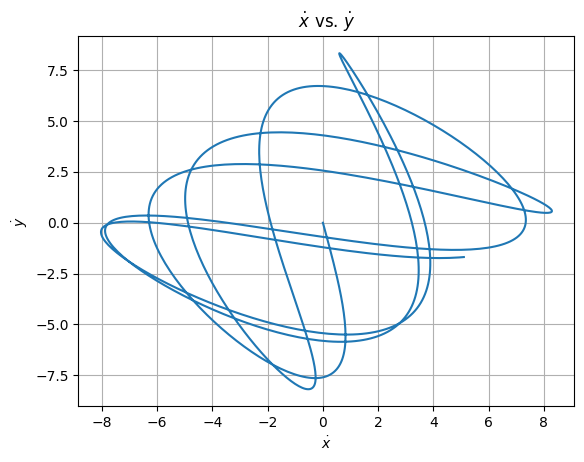

In [98]:
plt.plot(u_values, s_values)
plt.xlabel('$\dot x$')
plt.ylabel('$\dot y$')
plt.title('$\dot x$ vs. $\dot y$')
plt.grid(True)
plt.show()

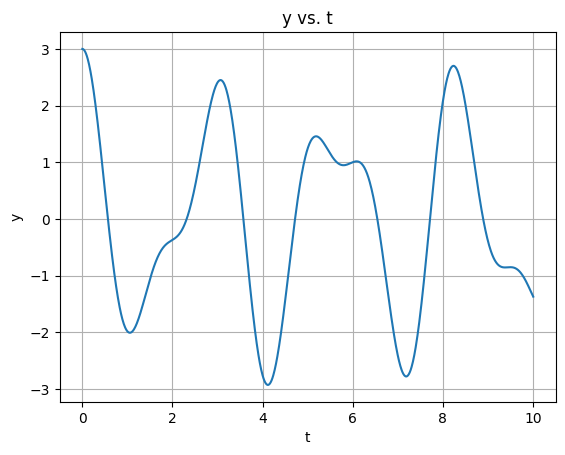

In [119]:
plt.plot(time,y_values)
plt.xlabel('t')
plt.ylabel('y')
plt.title('y vs. t')
plt.grid(True)
plt.show()

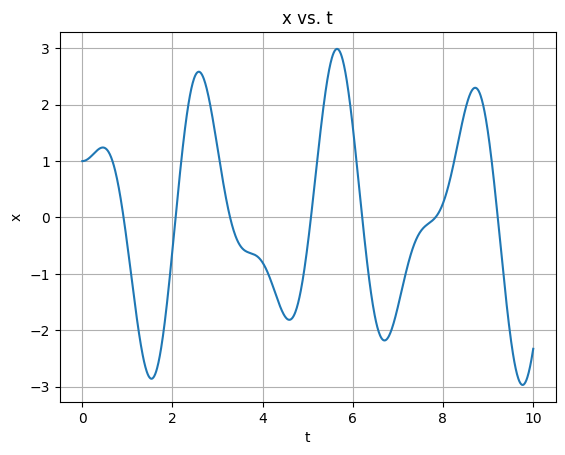

In [120]:
plt.plot(time,x_values)
plt.xlabel('t')
plt.ylabel('x')
plt.title('x vs. t')
plt.grid(True)
plt.show()

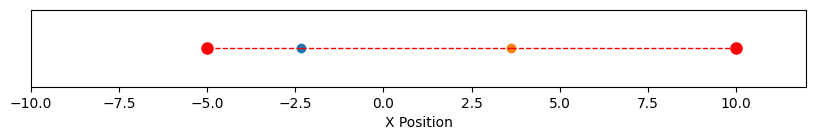

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Create an animation function
fig, ax = plt.subplots(figsize=(10, 1))
ax.set_xlim(-10, 12)  # Adjust the x-axis limits
ax.set_ylim(-1, 1)  # Set the y-axis limits to a small range
ax.set_xlabel('X Position')
ax.set_yticks([])  # Remove y-axis ticks and labels

# Add fixed points at x = -5 and x = 10
fixed_point1, = ax.plot(-5, 0, 'ro', markersize=8, label='Fixed Point 1')
fixed_point2, = ax.plot(10, 0, 'ro', markersize=8, label='Fixed Point 2')

particle1, = ax.plot([], [], 'o-', lw=2, label='Particle 1')  # Particle 1
particle2, = ax.plot([], [], 'o-', lw=2, label='Particle 2')  # Particle 2

line_to_fixed_point1, = ax.plot([], [], 'r--', lw=1)  # Dotted line to Fixed Point 1
line_to_fixed_point2, = ax.plot([], [], 'r--', lw=1)  # Dotted line to Fixed Point 2
line_bet_particle, = ax.plot([], [], 'r--', lw=1)  # Dotted line between the particles

def animate(i):
    particle1.set_data(x_values[i], 0)  # Update the x-position of Particle 1 (y-position remains 0)
    particle2.set_data(y_values[i] + 5, 0)  # Update the x-position of Particle 2 (y-position remains 0)
    
    # Update the dotted lines to connect particles to fixed points
    line_to_fixed_point1.set_data([x_values[i], -5], [0, 0])
    line_to_fixed_point2.set_data([y_values[i] + 5, 10], [0, 0])
    
    # Update the dotted line between the particles
    line_bet_particle.set_data([x_values[i], y_values[i] + 5], [0, 0])

    return particle1, particle2, line_to_fixed_point1, line_to_fixed_point2, line_bet_particle

ani = FuncAnimation(fig, animate, frames=len(x_values), repeat=False, blit=True)

# Display the animation in Jupyter Notebook or Lab
HTML(ani.to_jshtml())
